#### This Notebook use Gemini and Imagen and helps to create a simple video from those images

#### Author: Saurabh Mangal (saurabhmangal@google.com)
##### Date: 21st Feb
##### Description: This notebook contains part 6 of lab

 Copyright (c) [2024] [saurabhmangal@] -- 
 This notebook is licensed under the Commercial License.

### Setup

In [1]:
!pip install --upgrade google-cloud-aiplatform -q
!sudo apt-get update 
!sudo apt-get install -y ffmpeg

Hit:1 https://nvidia.github.io/libnvidia-container/stable/debian10/amd64  InRelease
Hit:2 https://deb.debian.org/debian bullseye InRelease                         
Get:3 https://deb.debian.org/debian-security bullseye-security InRelease [48.4 kB]
Get:4 https://download.docker.com/linux/debian bullseye InRelease [43.3 kB]    
Hit:5 https://nvidia.github.io/nvidia-container-runtime/stable/debian10/amd64  InRelease
Get:6 https://deb.debian.org/debian bullseye-updates InRelease [44.1 kB]       
Get:7 https://deb.debian.org/debian bullseye-backports InRelease [49.0 kB] 
Hit:8 https://nvidia.github.io/nvidia-docker/debian10/amd64  InRelease         
Get:9 https://packages.cloud.google.com/apt gcsfuse-bullseye InRelease [1237 B]
Get:10 https://packages.cloud.google.com/apt google-compute-engine-bullseye-stable InRelease [5146 B]
Hit:11 https://packages.cloud.google.com/apt cloud-sdk-bullseye InRelease
Get:12 https://packages.cloud.google.com/apt google-fast-socket InRelease [5015 B]
Get:13 ht

In [2]:
# GCP_PROJECT= PROJECT_ID=project_id= !(gcloud config get-value core/project)
PROJECT_IDS= !(gcloud config get-value core/project)
PROJECT_ID = PROJECT_IDS[0]
GCP_PROJECT = PROJECT_ID
LOCATION = REGION = 'asia-southeast1'

print(GCP_PROJECT)
print(PROJECT_ID)


ai-sandbox-company-16
ai-sandbox-company-16


In [32]:
# Please use the same name as UNIQUE_PREFIX in the other notebooks
PREFIX = "eu-notebooks-2" 
GCS_BUCKET_LOCATION = "asia-southeast1"
GCS_BUCKET_NAME = f"{PROJECT_ID}-{PREFIX}"
GCS_BUCKET_PATH = f"gs://{GCS_BUCKET_NAME}"

GCS_BUCKET_URI = f"gs://{GCS_BUCKET_NAME}/videos"

# Create a Cloud Storage Bucket
!gcloud storage buckets create $GCS_BUCKET_PATH --location=$GCS_BUCKET_LOCATION

# Upload the videos located in the videos/ directory into the GCS bucket that you created
!gsutil cp -r ./video/* $GCS_BUCKET_URI

# Verify that all Videos 1 to 5 are uploaded to the GCS bucket (5 files in total)
!gsutil ls $GCS_BUCKET_URI

Creating gs://ai-sandbox-company-16-eu-notebooks-2/...
Copying file://./video/butterflies_1280.mp4 [Content-Type=video/mp4]...
Copying file://./video/butterflies_960p.mp4 [Content-Type=video/mp4]...         
Copying file://./video/chkpt.mp3 [Content-Type=audio/mpeg]...                   
Copying file://./video/elefant_1280p.mp4 [Content-Type=video/mp4]...            
| [4 files][135.7 MiB/135.7 MiB]   54.3 MiB/s                                   
==> NOTE: You are performing a sequence of gsutil operations that may
run significantly faster if you instead use gsutil -m cp ... Please
see the -m section under "gsutil help options" for further information
about when gsutil -m can be advantageous.

Copying file://./video/giraffes_1280p.mp4 [Content-Type=video/mp4]...
Copying file://./video/my_tiger.avi [Content-Type=video/x-msvideo]...           
Copying file://./video/my_video.avi [Content-Type=video/x-msvideo]...           
Copying file://./video/my_video_harry_music_v1.mp4 [Content-Type=

In [33]:
# Initialize Vertex AI
import vertexai

vertexai.init(project=PROJECT_ID, location=LOCATION)

In [34]:
from vertexai.preview.generative_models import (
    GenerationConfig,
    GenerativeModel,
    Image,
    Part,
)

In [35]:
multimodal_model = GenerativeModel("gemini-pro-vision")


### Define helper functions


In [36]:
import http.client
import typing
import urllib.request

import IPython.display
from PIL import Image as PIL_Image
from PIL import ImageOps as PIL_ImageOps


def display_images(
    images: typing.Iterable[Image],
    max_width: int = 600,
    max_height: int = 350,
) -> None:
    for image in images:
        pil_image = typing.cast(PIL_Image.Image, image._pil_image)
        if pil_image.mode != "RGB":
            # RGB is supported by all Jupyter environments (e.g. RGBA is not yet)
            pil_image = pil_image.convert("RGB")
        image_width, image_height = pil_image.size
        if max_width < image_width or max_height < image_height:
            # Resize to display a smaller notebook image
            pil_image = PIL_ImageOps.contain(pil_image, (max_width, max_height))
        IPython.display.display(pil_image)


def get_image_bytes_from_url(image_url: str) -> bytes:
    with urllib.request.urlopen(image_url) as response:
        response = typing.cast(http.client.HTTPResponse, response)
        image_bytes = response.read()
    return image_bytes


def load_image_from_url(image_url: str) -> Image:
    image_bytes = get_image_bytes_from_url(image_url)
    return Image.from_bytes(image_bytes)


def display_content_as_image(content: str | Image | Part) -> bool:
    if not isinstance(content, Image):
        return False
    display_images([content])
    return True


def display_content_as_video(content: str | Image | Part) -> bool:
    if not isinstance(content, Part):
        return False
    part = typing.cast(Part, content)
    file_path = part.file_data.file_uri.removeprefix("gs://")
    video_url = f"https://storage.googleapis.com/{file_path}"
    IPython.display.display(IPython.display.Video(video_url, width=600))
    return True


def print_multimodal_prompt(contents: list[str | Image | Part]):
    """
    Given contents that would be sent to Gemini,
    output the full multimodal prompt for ease of readability.
    """
    for content in contents:
        if display_content_as_image(content):
            continue
        if display_content_as_video(content):
            continue
        print(content)

### Generating a video description


Gemini 
https://cloud.google.com/vertex-ai/pricing -- $0.002 / second
For 60 seconds -video prices- 0.12$

In [37]:
prompt = """
What is shown in this video?
Where should I go to see it?
What are the top 5 places in the world that look like this?
"""
video = Part.from_uri(
    uri="gs://github-repo/img/gemini/multimodality_usecases_overview/mediterraneansea.mp4",
    mime_type="video/mp4",
)
contents = [prompt, video]

responses = multimodal_model.generate_content(contents, stream=True)

print("-------Prompt--------")
print_multimodal_prompt(contents)

print("\n-------Response--------")
for response in responses:
    print(response.text, end="")

-------Prompt--------

What is shown in this video?
Where should I go to see it?
What are the top 5 places in the world that look like this?




-------Response--------
 This is a photo of the Mediterranean Sea in Turkey. The water is a deep blue color and the sky is light blue with some clouds. The shore is rocky and there are some buildings on the hill. The water is calm and there are some waves crashing on the shore.

You can visit this place by going to Turkey.

The top 5 places in the world that look like this are:

1. The Amalfi Coast, Italy
2. The Greek Islands, Greece
3. The Turkish Riviera, Turkey
4. The Croatian Coast, Croatia
5. The French Riviera, France

In [38]:
!gsutil ls $GCS_BUCKET_URI

gs://ai-sandbox-company-16-eu-notebooks-2/videos/butterflies_1280.mp4
gs://ai-sandbox-company-16-eu-notebooks-2/videos/butterflies_960p.mp4
gs://ai-sandbox-company-16-eu-notebooks-2/videos/chkpt.mp3
gs://ai-sandbox-company-16-eu-notebooks-2/videos/elefant_1280p.mp4
gs://ai-sandbox-company-16-eu-notebooks-2/videos/giraffes_1280p.mp4
gs://ai-sandbox-company-16-eu-notebooks-2/videos/my_tiger.avi
gs://ai-sandbox-company-16-eu-notebooks-2/videos/my_video.avi
gs://ai-sandbox-company-16-eu-notebooks-2/videos/my_video_harry_music_v1.mp4
gs://ai-sandbox-company-16-eu-notebooks-2/videos/seafood_1280p.mp4


In [39]:
prompt = """
What is shown in this video?
Where should I go to see it?
What are the top 5 types of items that we see here?
"""

video_list = [f"gs://{GCS_BUCKET_NAME}/videos/butterflies_1280.mp4",
f"gs://{GCS_BUCKET_NAME}/videos/butterflies_960p.mp4",
f"gs://{GCS_BUCKET_NAME}/videos/elefant_1280p.mp4",
f"gs://{GCS_BUCKET_NAME}/videos/giraffes_1280p.mp4",
f"gs://{GCS_BUCKET_NAME}/videos/seafood_1280p.mp4"]

for i in range(0, len(video_list)) :
    print("\n\n\nHere is the video number",i, video_list[i])
    video = Part.from_uri( uri=video_list[i],
    mime_type="video/mp4",)
    contents = [prompt, video]
    
    responses = multimodal_model.generate_content(contents, stream=True)

    print("-------Prompt--------")
    print_multimodal_prompt(contents)

    print("\n-------Response--------")
    for response in responses:
        print(response.text, end="")




Here is the video number 0 gs://ai-sandbox-company-16-eu-notebooks-2/videos/butterflies_1280.mp4
-------Prompt--------

What is shown in this video?
Where should I go to see it?
What are the top 5 types of items that we see here?




-------Response--------
 This video shows butterflies in a butterfly garden. You can see the butterflies flying around and feeding on the flowers. The most common types of butterflies in the video are the blue morpho, the yellow swallowtail, and the monarch.


Here is the video number 1 gs://ai-sandbox-company-16-eu-notebooks-2/videos/butterflies_960p.mp4
-------Prompt--------

What is shown in this video?
Where should I go to see it?
What are the top 5 types of items that we see here?




-------Response--------
 This video shows butterflies in a butterfly garden. It was taken at The Butterfly Farm in Monteverde, Costa Rica. The five types of butterflies shown are the blue morpho, the malachite, the postman, the zebra longwing, and the Julia butterfly.


Here is the video number 2 gs://ai-sandbox-company-16-eu-notebooks-2/videos/elefant_1280p.mp4
-------Prompt--------

What is shown in this video?
Where should I go to see it?
What are the top 5 types of items that we see here?




-------Response--------
 A family of elephants crossing the river.
You can see them in Mana Pools National Park, Zimbabwe.
The top 5 types of items that we see here are:
elephants
water
trees
sand
grass


Here is the video number 3 gs://ai-sandbox-company-16-eu-notebooks-2/videos/giraffes_1280p.mp4
-------Prompt--------

What is shown in this video?
Where should I go to see it?
What are the top 5 types of items that we see here?




-------Response--------
 This is a video of giraffes in the African savanna. You can see the giraffes' long necks and spotted coats. The giraffes are eating leaves from the trees. The video was taken in Hwange National Park, Zimbabwe.
The top 5 types of items that we see here are:
1. Giraffes
2. Trees
3. Grass
4. Bushes
5. Rocks


Here is the video number 4 gs://ai-sandbox-company-16-eu-notebooks-2/videos/seafood_1280p.mp4
-------Prompt--------

What is shown in this video?
Where should I go to see it?
What are the top 5 types of items that we see here?




-------Response--------
 This is a video of a seafood market in Japan. There are many different types of seafood on display, including fish, crabs, shrimp, and shellfish. The market is very crowded and there are many people buying and selling seafood.

You can go to the Tsukiji Fish Market in Tokyo, Japan.

The top 5 types of items that we see here are:

1. Fish
2. Crabs
3. Shrimp
4. Shellfish
5. Octopus

### Convert Images into Video

In [40]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [41]:
import cv2
import os
import glob


### Default way of creating videos from images

In [42]:
def create_video(image_folder, video_name, fps):
    images = [img for img in os.listdir(image_folder) if img.endswith(".jpg") or img.endswith(".png")]
    print(images)
    images.sort()  # Ensure images are in the correct order
    frame = cv2.imread(os.path.join(image_folder, images[0]))
    height, width, layers = frame.shape

    video = cv2.VideoWriter(video_name, 0, fps, (width, height))

    for image in images:
        video.write(cv2.imread(os.path.join(image_folder, image)))

    cv2.destroyAllWindows()
    video.release()
    


### Resize and create video

In [43]:
!pip install mediapy

In [44]:
import mediapy as media

In [45]:
# Set the desired video properties
fps = 1  # Frames per second
width = 640  # Video width
height = 480  # Video height
image_folder = './images/tiger-512/'

# Get a list of image files in the directory
image_files = glob.glob(os.path.join(image_folder, "*.png"))

# Sort the image files in ascending order
image_files.sort(key=os.path.getmtime)

# Resize all images to the same size
resized_images = []
for image_file in image_files:
    image = cv2.imread(image_file)
    resized_image = cv2.resize(image, (width, height))
    resized_images.append(resized_image)

In [46]:
print(image_files)

[]


In [48]:
# Create a video writer object
size = (640, 480)
video_name = './video/my_tiger.avi' 

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video_writer = cv2.VideoWriter(video_name, fourcc, fps, size)

# Write the images to the video
for image in resized_images:
    video_writer.write(image)

# Release the video writer object
video_writer.release()

#from IPython.display import Video

#Video(video_name) 

# video = media.read_video(video_name)
# media.show_video(video, title = "Hello Tiger", fps=2, width=600)

### lets use Imagen and modify one image for few things and create a few copies of that to really create a movie

In [49]:
# from vertexai.preview.vision_models import ImageGenerationModel

In [50]:
import os
import vertexai
from vertexai.preview.language_models import TextGenerationModel
from vertexai.preview.generative_models import GenerativeModel, Part
Region = f"{LOCATION}"
GCP_PROJECT= PROJECT_ID=project_id= f"{GCP_PROJECT}"

vertexai.init()

def generate_pro(input_prompt):
    model = GenerativeModel("gemini-pro")
    responses = model.generate_content(
    input_prompt,
    generation_config={
        "max_output_tokens": 2048,
        "temperature": 0.2,
        "top_p": 1
    },stream=True,)
    
    all_response  = []
    
    for response in responses:
        all_response.append(response.text)
    
    # print (all_response)
    
    return(" ".join(all_response))

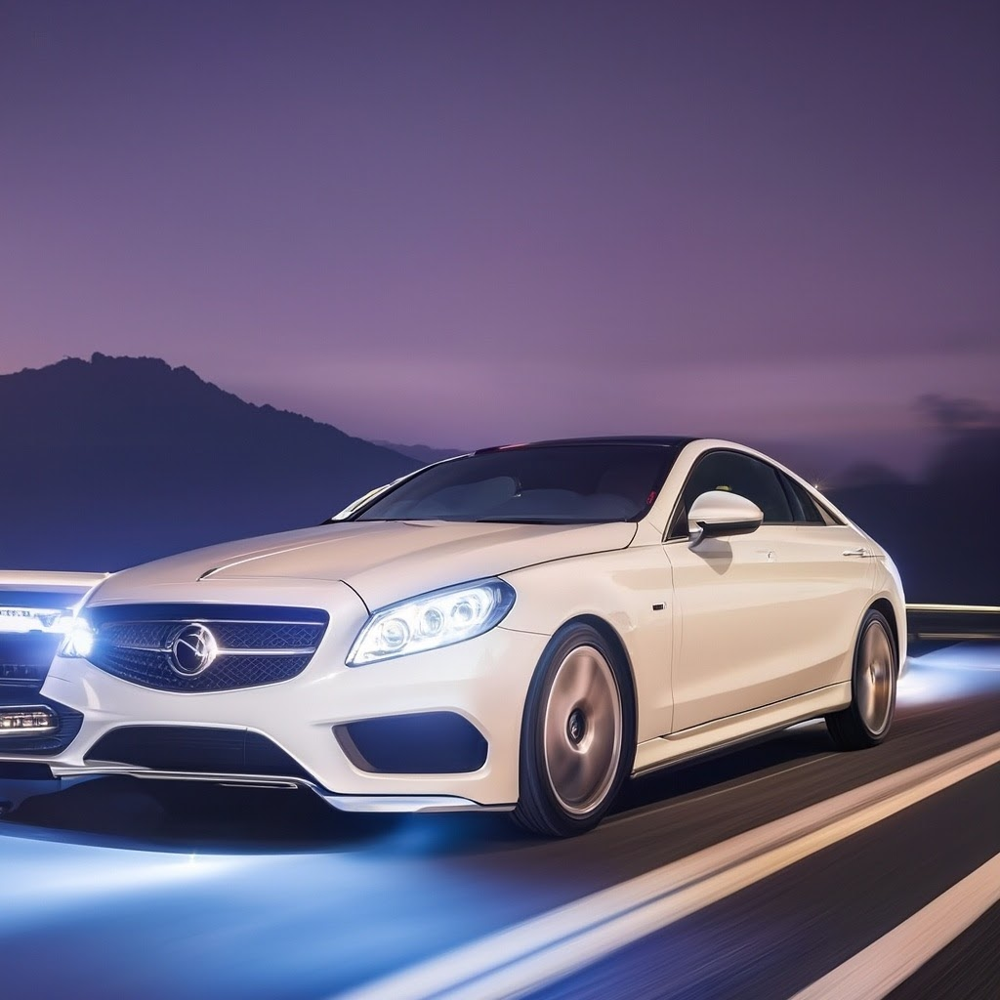

In [55]:
Google_Imagen_model = "imagegeneration@002" #"imagegeneration@005"
from vertexai.preview.vision_models import Image, ImageGenerationModel

imagen_model = ImageGenerationModel.from_pretrained(Google_Imagen_model)

input_question = "Show a picture of a white mercedes car driving on a road at night at 40km/h in Japan"
system_prompt = " Convert this question to a meaningful prompt for imagen model to create a good image - in photography style"

prompt = input_question + " " + system_prompt
image_prompt = generate_pro(prompt)

response = imagen_model.generate_images(
    prompt=image_prompt,
)

response.images[0].show()
response.images[0].save(location="./images/tiger-modified/gen-imagen.png")

del(imagen_model )

### Image editing

In [56]:
response.images[0].save(location="./images/tiger-modified/gen-imagen.png")

location_img = "./images/tiger-modified/gen-imagen.png"
base_img=Image.load_from_file(location=location_img)


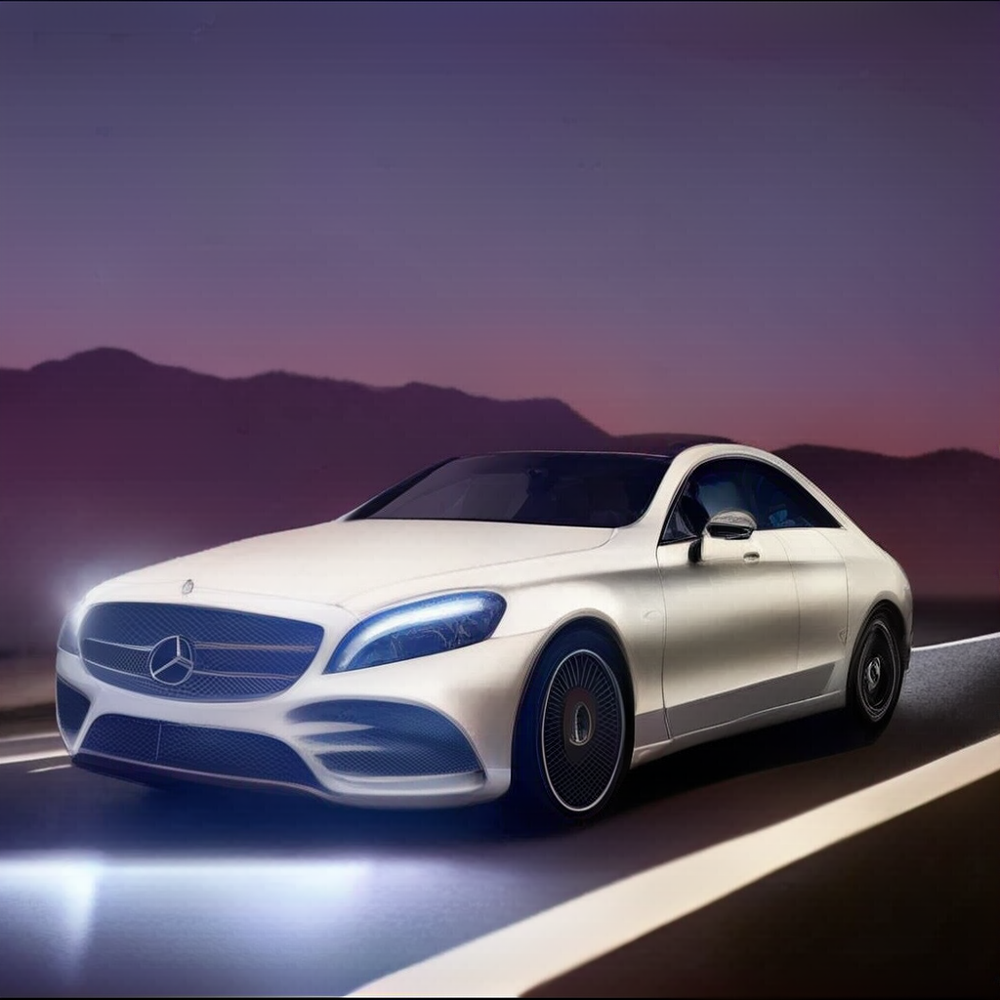

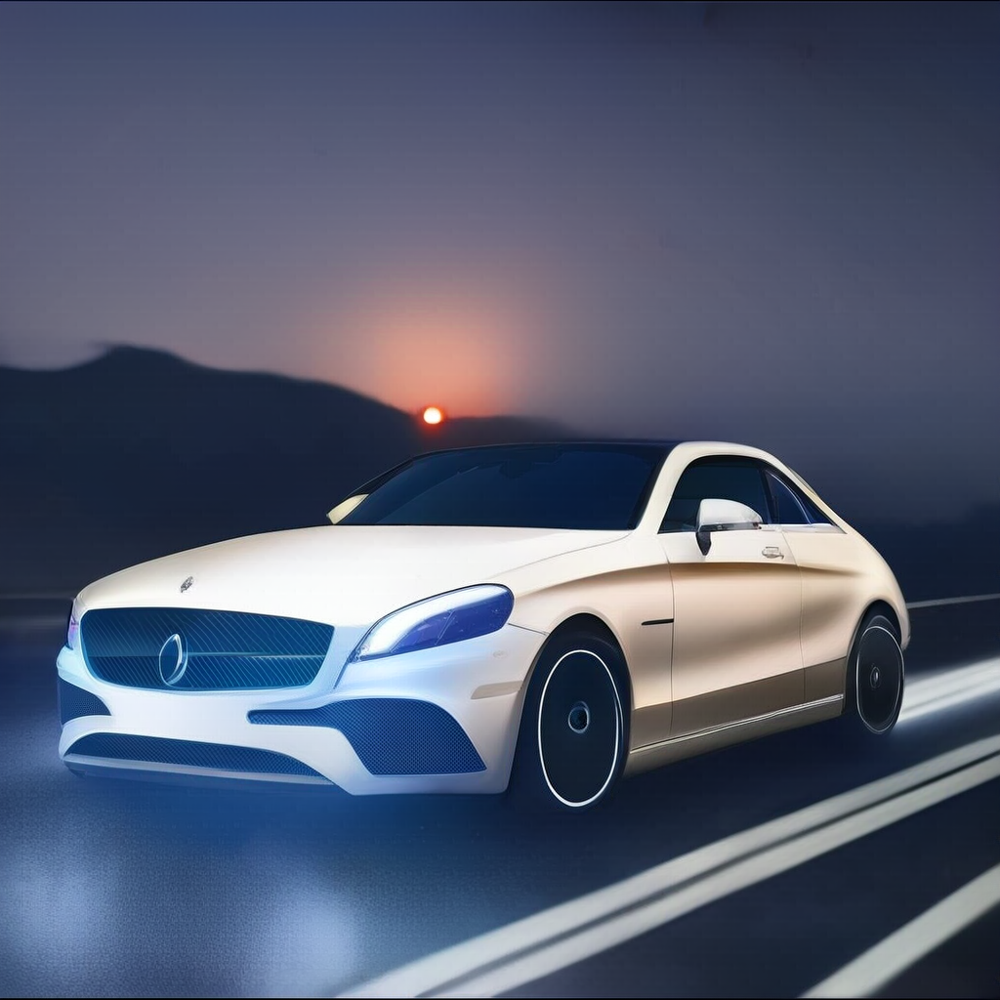

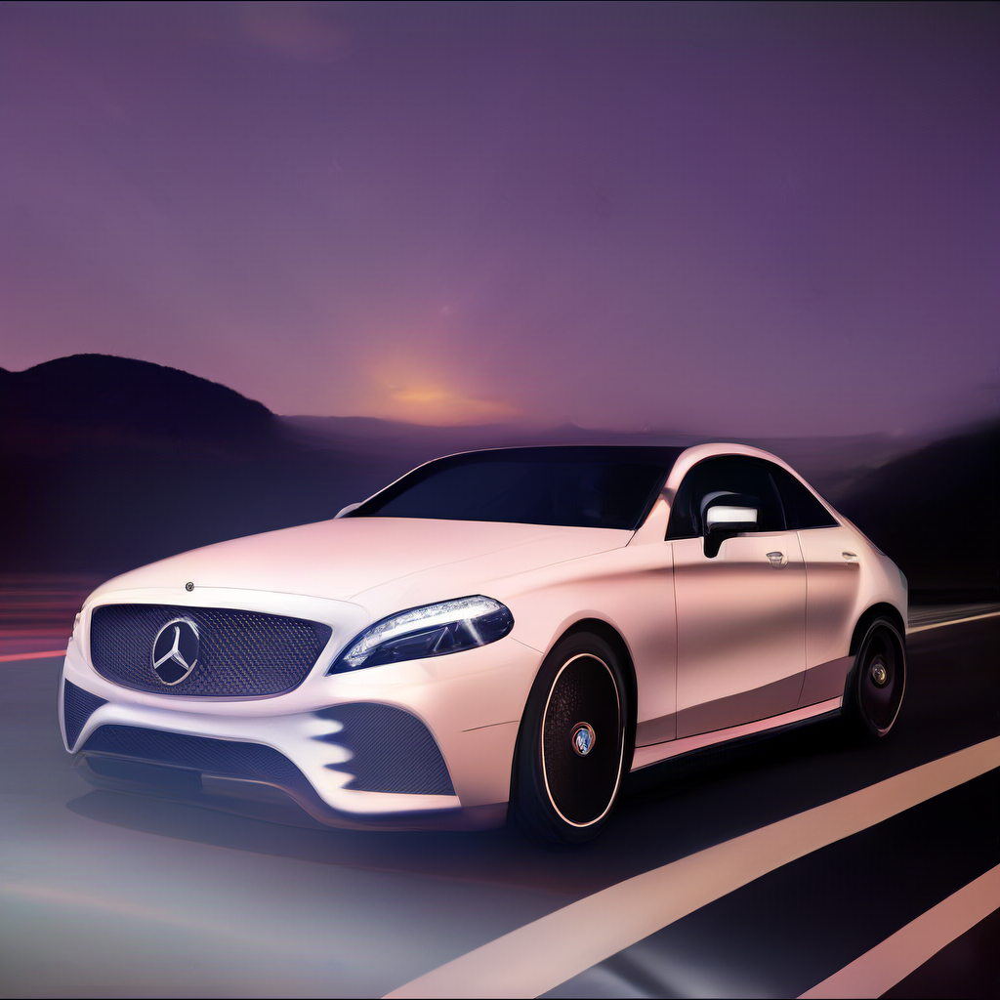

In [57]:
model = ImageGenerationModel.from_pretrained(Google_Imagen_model)

images = model.edit_image(
  base_image=base_img,
  prompt="Show the white mercedes car driving along the road at 40km/h in Japan with the sun rising higher in photography style",
  # negativePrompt = "red colour",
  # Optional:
  seed=10,
  guidance_scale=20,
  number_of_images=3
)

for i, image in enumerate(images):
    filename = f"edit-fire-img{i+1}.png"  # Include index in filename
    image.save(f"./images/tiger-modified/{filename}")

# Optional. View the edited images in a notebook.
# Use a loop for cleaner code
for image in images:
    image.show()

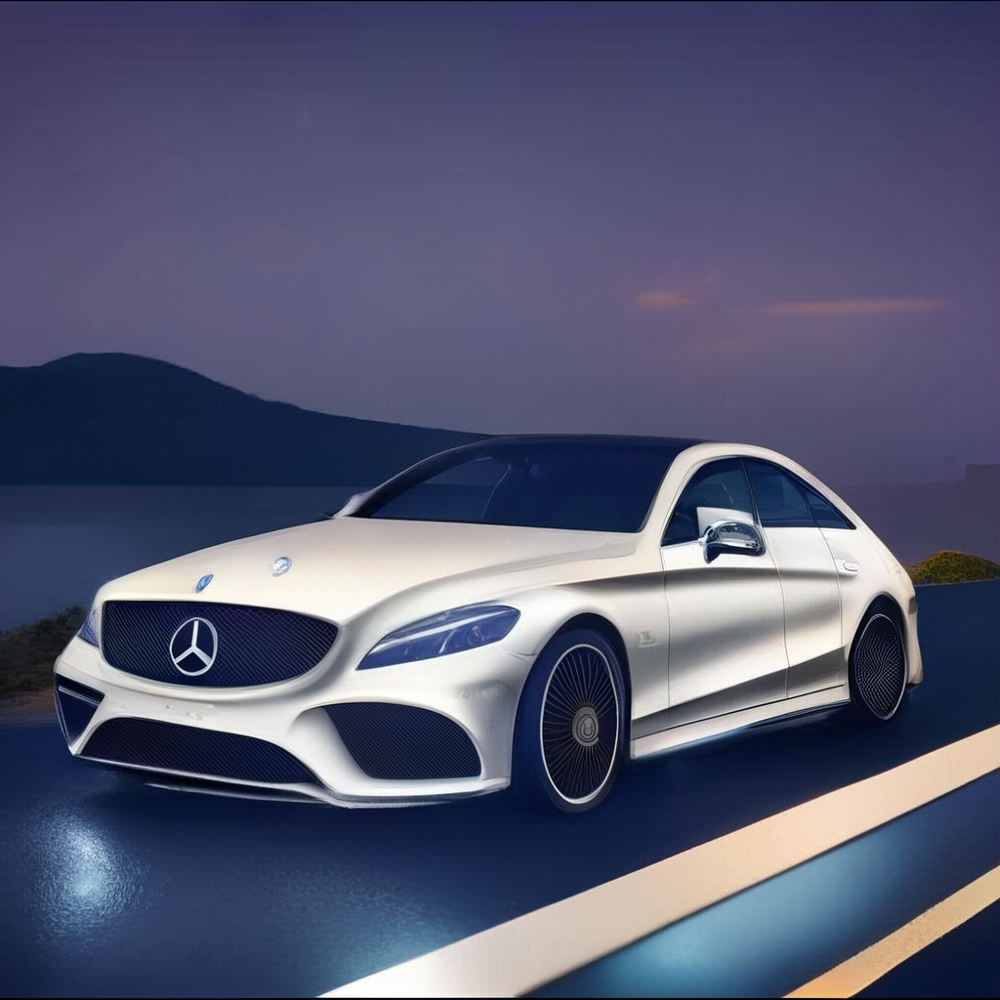

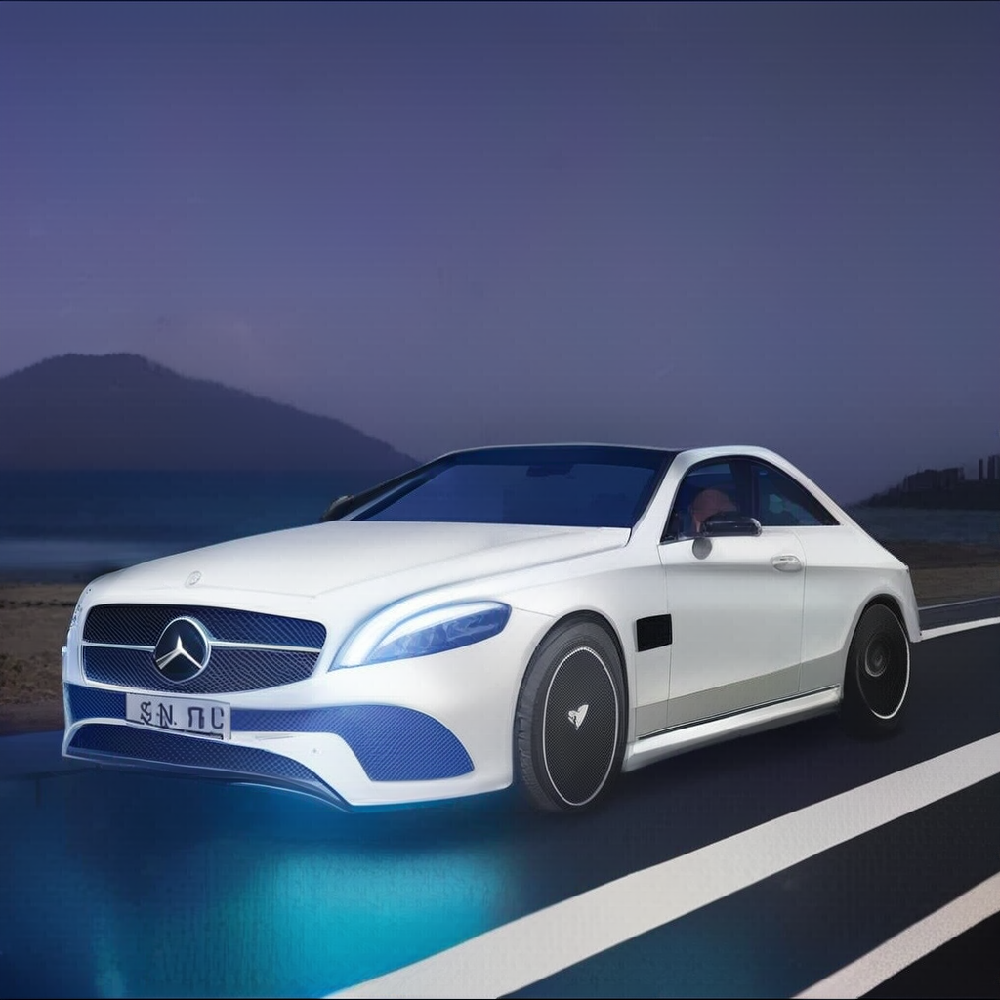

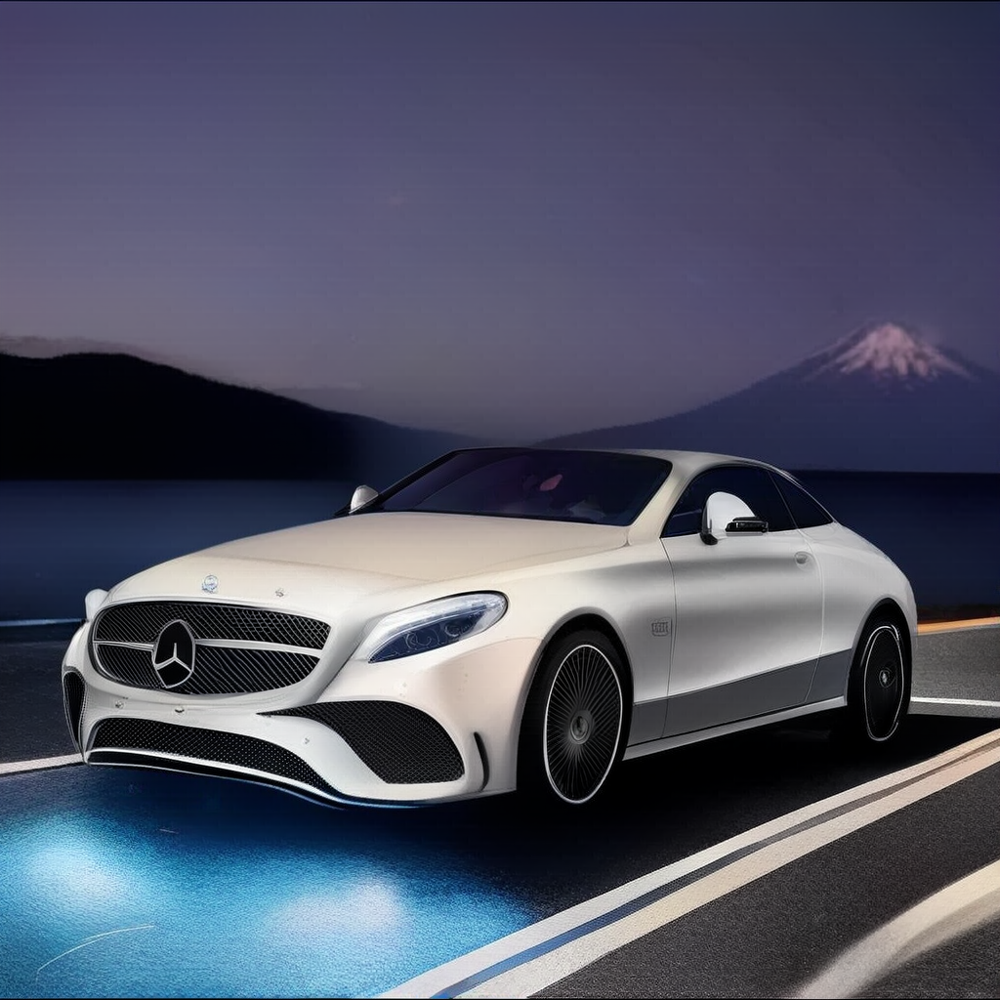

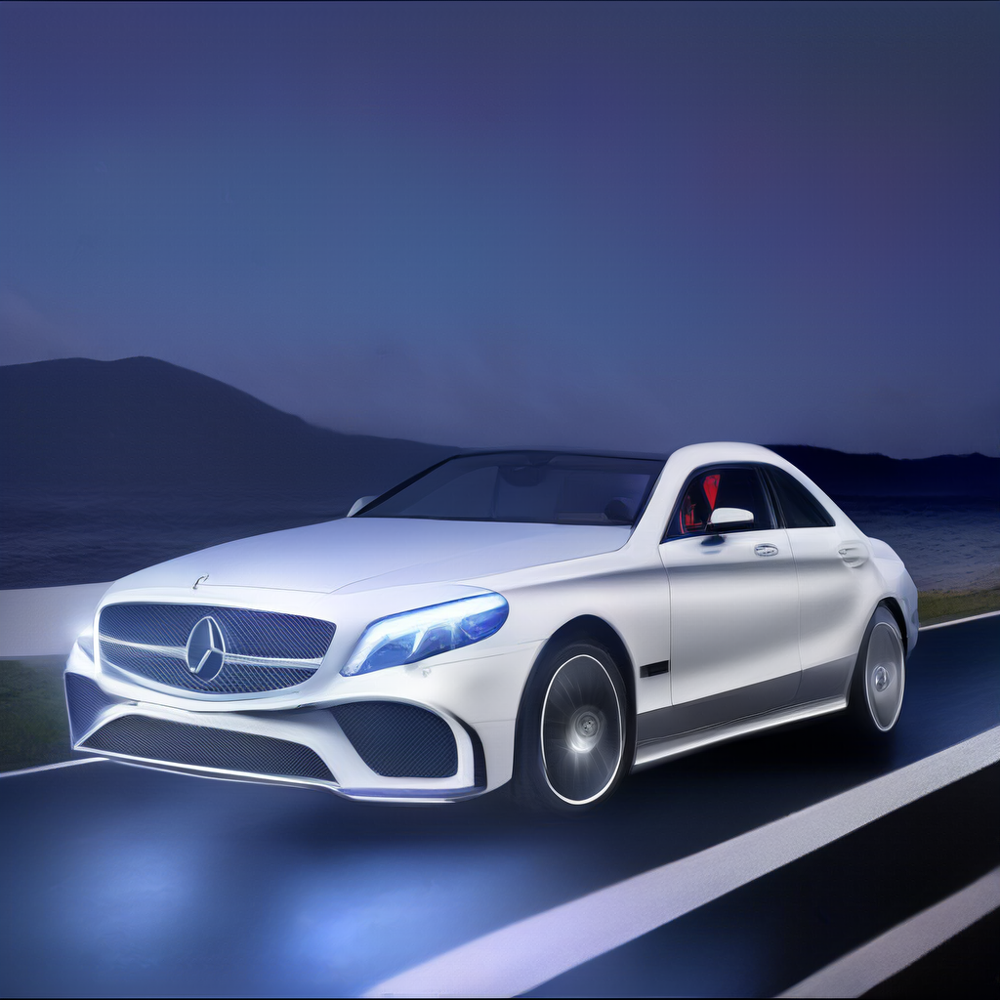

In [58]:

images = model.edit_image(
  base_image=base_img,
  prompt="Show the white mercedes car driving along the road at 40km/h in Japan and arriving at a beach in photography style",
  # negativePrompt = "red colour",
  # Optional:
  seed=0,
  guidance_scale=21,
  number_of_images=4
)

for i, image in enumerate(images):
    filename = f"edit-rainbow-img{i+1}.png"  # Include index in filename
    image.save(f"./images/tiger-modified/{filename}")

# Optional. View the edited images in a notebook.
# Use a loop for cleaner code
for image in images:
    image.show()

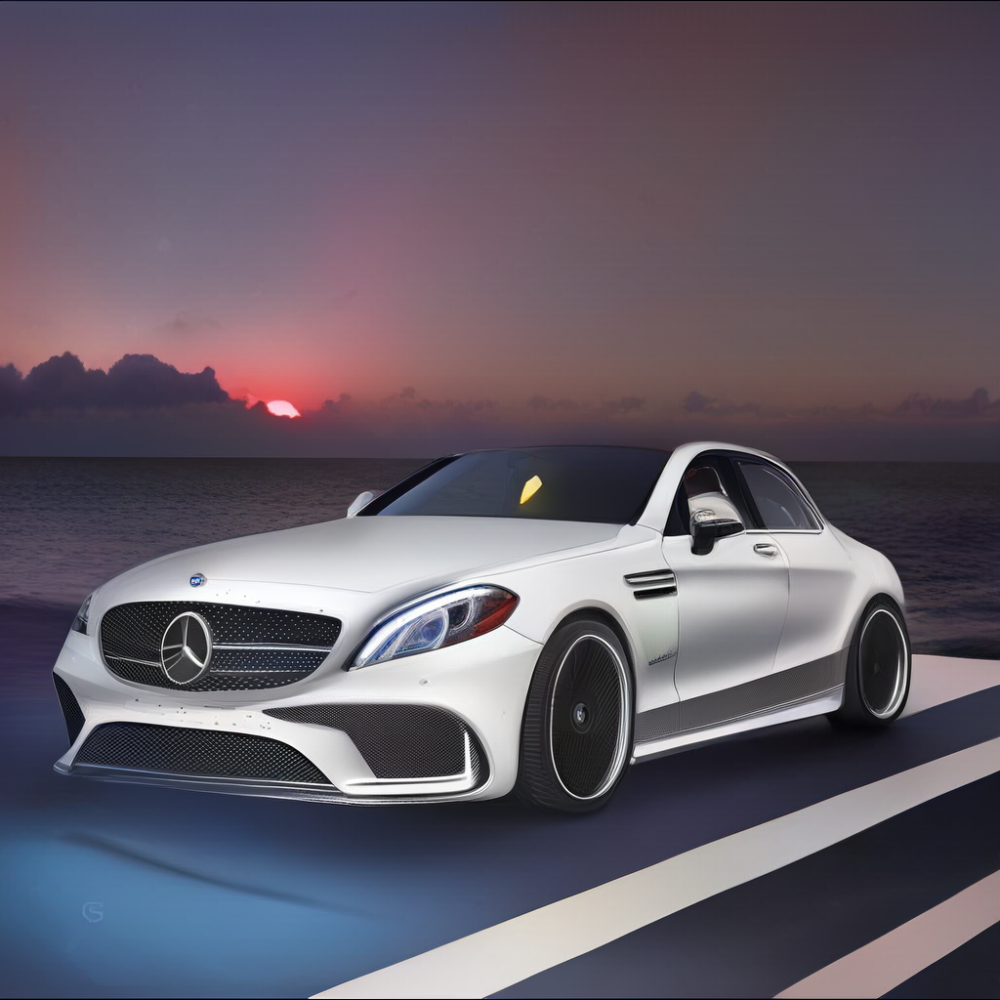

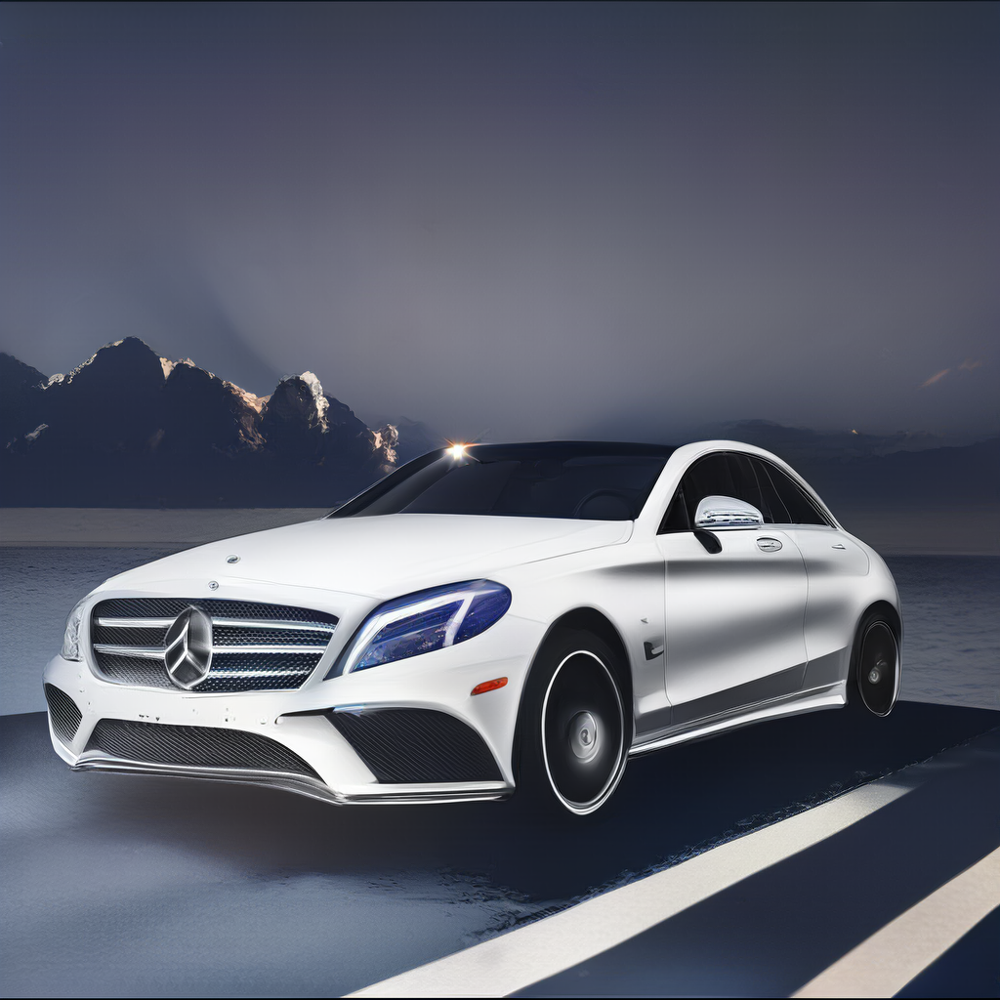

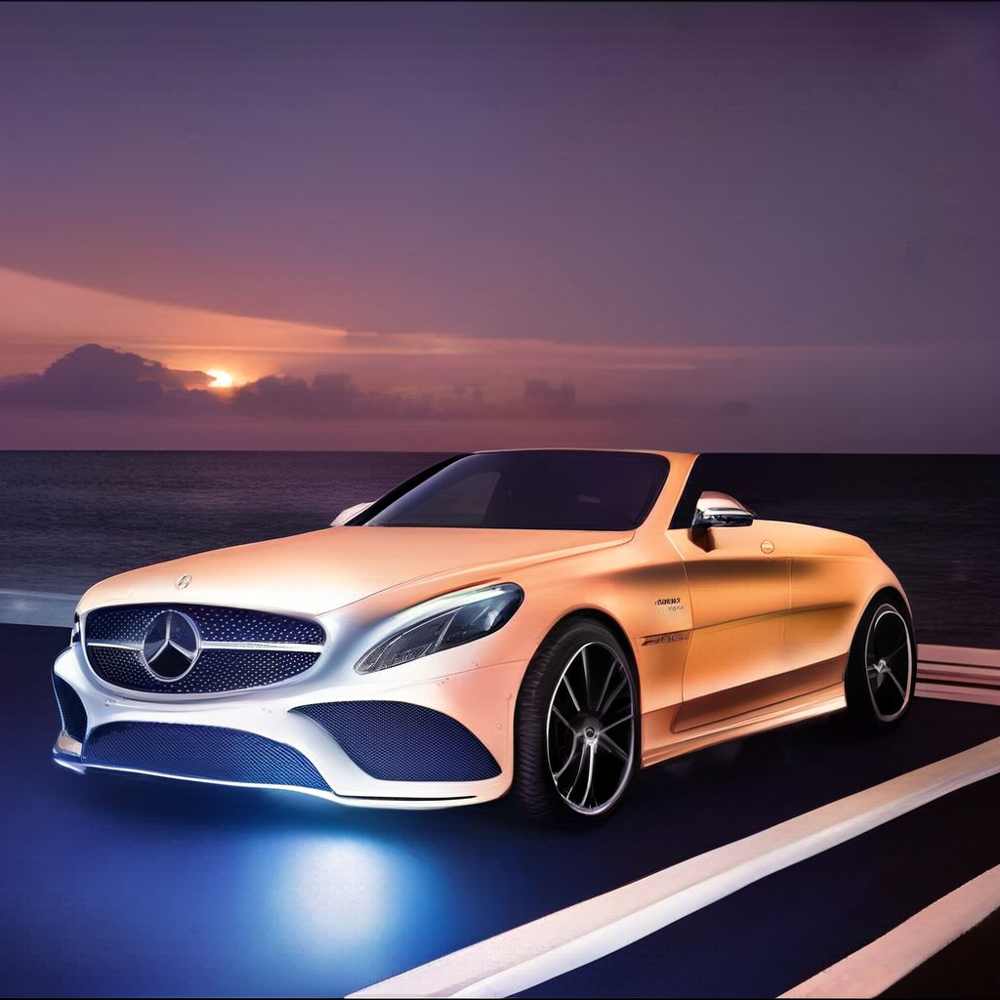

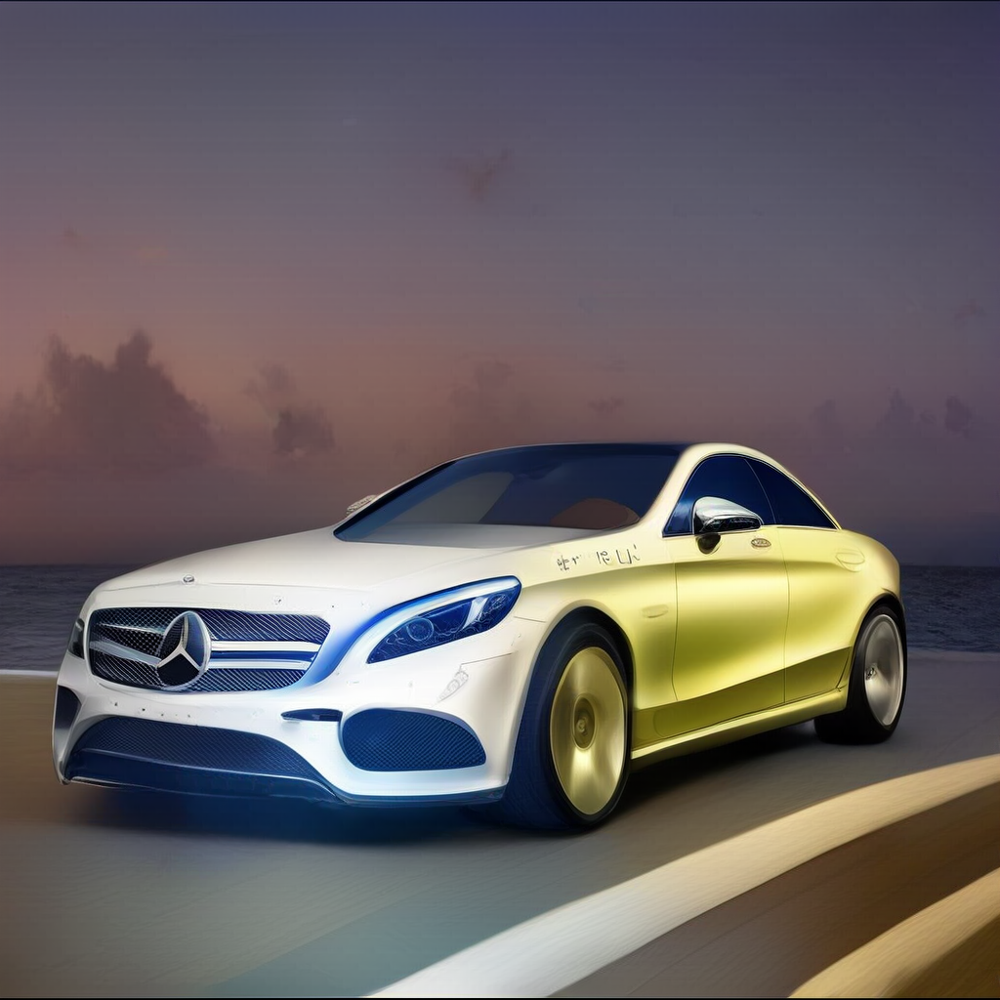

In [59]:

images = model.edit_image(
  base_image=base_img,
  prompt="show the same white mercedes car at the beach with the sun at the horizon in photography style",
  # negativePrompt = "red colour",
  # Optional:
  seed=12,
  guidance_scale=21,
  number_of_images=4
)

for i, image in enumerate(images):
    filename = f"edit-clouds-img{i+1}.png"  # Include index in filename
    image.save(f"./images/tiger-modified/{filename}")

# Optional. View the edited images in a notebook.
# Use a loop for cleaner code
for image in images:
    image.show()

### Convert Images to Videos

In [60]:
!pip install mediapy

In [61]:
import mediapy as media

In [62]:
# Set the desired video properties
fps = 1  # Frames per second
width = 800  # Video width
height = 580  # Video height
image_folder = './images/tiger-modified/'

# Get a list of image files in the directory
image_files = glob.glob(os.path.join(image_folder, "*.png"))

# Sort the image files in ascending order
image_files.sort(key=os.path.getmtime)

# Resize all images to the same size
resized_images = []
for image_file in image_files:
    image = cv2.imread(image_file)
    resized_image = cv2.resize(image, (width, height))
    resized_images.append(resized_image)

In [63]:
# Create a video writer object
size = (width, height)
video_name = './video/my_video_harry.mp4' 

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video_writer = cv2.VideoWriter(video_name, fourcc, fps, size)

# Write the images to the video
for image in resized_images:
    video_writer.write(image)

# Release the video writer object
video_writer.release()



In [64]:
# from IPython.display import Video

# Video(video_name) 

video = media.read_video(video_name)
media.show_video(video, title = "video without audio", fps=2, width=500)

In [68]:
!rm -rf my_video_harry_music_v1.mp4
!ffmpeg -i ./video/my_video_harry.mp4 -i ./video/chkpt.mp3 -c:v copy -c:a aac ./video/my_video_harry_music_v1.mp4 -y

ffmpeg version 4.3.6-0+deb11u1 Copyright (c) 2000-2023 the FFmpeg developers
  built with gcc 10 (Debian 10.2.1-6)
  configuration: --prefix=/usr --extra-version=0+deb11u1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab 

In [69]:
video_name_with_music = "my_video_harry_music_v1.mp4"
video = media.read_video('./video/my_video_harry_music_v1.mp4')
media.show_video(video, title = "HP", fps=1, width=500)

from IPython.display import Video
video_name_with_music = "./video/my_video_harry_music_v1.mp4"
Video(video_name_with_music) 


In [70]:
from IPython.display import HTML
HTML("""
<div align="middle">
<video width="80%" controls>
 <source src="./video/my_video_harry_music_v1.mp4" type="video/mp4"  
       controls>
</video></div>""")

### Download the video and play it if the media player is unable to display the video with music
#### its a quick attempt and can be improved with prompting